In [69]:
import numpy as np
import shapely
import astropy 
import h5py
import scipy
from scipy import stats
import scipy.optimize as opt
from scipy.stats import chisquare
from astropy.io import fits
from astrodendro import Dendrogram, pp_catalog
from astropy import units as u
from astropy.wcs import WCS
from astrodendro.analysis import PPStatistic
from matplotlib import pyplot as plt
import aplpy
from astropy.modeling import models,fitting
import astropy.wcs as wcs
from astropy.coordinates import SkyCoord
from astropy.table import Table
import statsmodels.api as sm
import matplotlib.patches as mpatche


In [70]:
#import dendrogram
d1 = Dendrogram.load_from('/home/student04/Newrepos/NGC1333_dendrogram.fits')
d2 = Dendrogram.load_from('/home/student04/Newrepos/B1_dendrogram.fits')
d3 = Dendrogram.load_from('/home/student04/Newrepos/L1455_dendrogram.fits')
d4 = Dendrogram.load_from('/home/student04/Newrepos/moment0_Dendrograms/L1451_dendrogram.fits')
d5 = Dendrogram.load_from('/home/student04/Newrepos/moment0_Dendrograms/IC348_dendrogram.fits')

In [43]:
m0 = fits.open('/home/student04/Downloads/NGC1333_NH3_11_all_rebase3_mom0_QA_trim.fits')
#Converts spatial axis and beam size into arcsecs
spatial_axis = (m0[0].header['CDELT2']*u.deg).to(u.arcsec)
bmaj = (m0[0].header['BMIN']*u.deg).to(u.arcsec)
bmin = (m0[0].header['BMIN']*u.deg).to(u.arcsec)
#set metadata
metadata={}
metadata['data_unit']= u.Jy
metadata['spatial_scale']= spatial_axis
metadata['beam_major']= bmaj
metadata['beam_minor']= bmin

In [44]:
#create catalogue from metadata
cat1 = pp_catalog(d1,metadata)
cat2 = pp_catalog(d2,metadata)
cat3 = pp_catalog(d3,metadata)
cat4 = pp_catalog(d4,metadata)
cat5 = pp_catalog(d5,metadata)

Computing catalog for 72 structures

[>                                        ] 1%
[=>                                       ] 2%
[=>                                       ] 4%
[==>                                      ] 5%
[==>                                      ] 6%
[===>                                     ] 8%
[===>                                     ] 9%
[====>                                    ] 11%
[=====>                                   ] 12%
[=====>                                   ] 13%
[======>                                  ] 15%
[======>                                  ] 16%
[=======>                                 ] 18%
[=======>                                 ] 19%
[========>                                ] 20%
[========>                                ] 22%
[=========>                               ] 23%
[==========>                              ] 25%
[==========>                              ] 26%
[===========>                             ] 27%
[=========


[=================>                       ] 43%
[=================>                       ] 44%
[==================>                      ] 45%
[==================>                      ] 47%
[===================>                     ] 48%
[===================>                     ] 49%
[====================>                    ] 51%
[=====================>                   ] 52%
[=====================>                   ] 54%
[======================>                  ] 55%
[======================>                  ] 56%
[=======================>                 ] 58%
[=======================>                 ] 59%
[========================>                ] 61%
[========================>                ] 62%
[=========================>               ] 63%
[==========================>              ] 65%
[==========================>              ] 66%
[===========================>             ] 68%
[===========================>             ] 69%
[============================>         


[==================================>      ] 86%
[===================================>     ] 88%
[====================================>    ] 91%
[=====================================>   ] 94%
[======================================>  ] 97%
[=======================================> ] 99%
[========================================>] 100%
Computing catalog for 25 structures

[=>                                       ] 4%
[===>                                     ] 8%
[====>                                    ] 12%
[======>                                  ] 16%
[========>                                ] 20%
[=========>                               ] 24%
[===========>                             ] 28%
[============>                            ] 32%
[==============>                          ] 36%
[================>                        ] 40%
[=================>                       ] 44%
[===================>                     ] 48%
[====================>                    ] 52%
[==


[==============================>          ] 75%
[===================================>     ] 87%
[========================================>] 100%
[========================================>] 100%
Computing catalog for 25 structures

[=>                                       ] 4%
[===>                                     ] 8%
[====>                                    ] 12%
[======>                                  ] 16%
[========>                                ] 20%
[=========>                               ] 24%
[===========>                             ] 28%
[============>                            ] 32%
[==============>                          ] 36%
[================>                        ] 40%
[=================>                       ] 44%
[===================>                     ] 48%
[====================>                    ] 52%
[======================>                  ] 56%
[========================>                ] 60%
[=========================>               ] 64%
[=

In [45]:
''''In astrodendro, position angle is given by the angle counterclockwise from the +x axis. This
is the exact same opposite to how the velocity gradient direction is defined. Hence, we must flip
the position angle about the y-axis to make sure the two quantities are definied the same way.'''
def position_angle(d):
    x = len(d)
    angle = []
    for i in range(x):
        if d[i].is_leaf:
            s = d[i]
            stat = PPStatistic(s,metadata=metadata)
            a = stat.position_angle/(1*u.deg)
            if a>=0:
                angle.append(180-a)
            else:
                angle.append(-180-a)
    position_angle_leaf = np.array(angle)
    return position_angle_leaf

In [46]:
position_angle_d1 = np.delete(position_angle(d1),-1) #deletes falsely identified core
position_angle_d2 = position_angle(d2)
position_angle_d3 = position_angle(d3)
position_angle_d4 = position_angle(d4)
position_angle_d5 = position_angle(d5)

In [47]:
#extracts vlsr
V_d1 = fits.open('/home/student04/Downloads/parameter_maps/Vlsr/NGC1333_NH3_Vlsr_all_rebase3_masked.fits')
V_d2 = fits.open('/home/student04/Downloads/parameter_maps/Vlsr/B1_NH3_Vlsr_all_rebase3_masked.fits')
V_d3 = fits.open('/home/student04/Downloads/parameter_maps/Vlsr/L1455_NH3_Vlsr_all_rebase3_masked.fits')
V_d4 = fits.open('/home/student04/Downloads/parameter_maps/Vlsr/L1451_NH3_Vlsr_all_rebase3_masked.fits')
V_d5 = fits.open('/home/student04/Downloads/parameter_maps/Vlsr/IC348_NH3_Vlsr_all_rebase3_masked.fits')

In [48]:
data1 = V_d1[0].data
w1 = WCS(V_d1[0])
index1=[]
for i in range(72):
    if d1[i].is_leaf:
        index1.append(i)
index1 = np.array(index1)
index1 = np.delete(index1,-1) #rejects the 71th core
data2 = V_d2[0].data
w2 = WCS(V_d2[0])
index2=[]
for i in range(36):
    if d2[i].is_leaf:
        index2.append(i)
index2 = np.array(index2)
data3 = V_d3[0].data
w3 = WCS(V_d3[0])
index3=[]
for i in range(25):
    if d3[i].is_leaf:
        index3.append(i)
index3 = np.array(index3)
data4 = V_d4[0].data
w4 = WCS(V_d4[0])
index4=[]
for i in range(8):
    if d4[i].is_leaf:
        index4.append(i)
index4 = np.array(index4)
data5 = V_d5[0].data
w5 = WCS(V_d5[0])
index5=[]
for i in range(25):
    if d5[i].is_leaf:
        index5.append(i)
index5 = np.array(index5)

In [49]:
#import error in vlsr map
error1 = fits.open('/home/student04/Downloads/parameter_maps/eVlsr/NGC1333_NH3_eVlsr_all_rebase3_masked.fits')
error2 = fits.open('/home/student04/Downloads/parameter_maps/eVlsr/B1_NH3_eVlsr_all_rebase3_masked.fits')
error3 = fits.open('/home/student04/Downloads/parameter_maps/eVlsr/L1455_NH3_eVlsr_all_rebase3_masked.fits')
error4 = fits.open('/home/student04/Downloads/parameter_maps/eVlsr/L1451_NH3_eVlsr_all_rebase3_masked.fits')
error5 = fits.open('/home/student04/Downloads/parameter_maps/eVlsr/IC348_NH3_eVlsr_all_rebase3_masked.fits')
error1 = error1[0].data
error2 = error2[0].data
error3 = error3[0].data
error4 = error4[0].data
error5 = error5[0].data

In [50]:
#defines a function that fits a gradient to the core velocity map 
def velocity_gradient(d,index,data,w,error,dist):
    grad_orientation = []
    slope_X=[]
    slope_Y=[]
    for i in index:
        structure = d[i]
        mask = structure.get_mask()
        y,x = structure.indices()
        v = data[y,x]*u.km/u.s #loads velocity data
        wx,wy = w.wcs_pix2world(x,y,1)#converts from pixel coordinate to world coordinates
        model = models.Planar2D()
        fitter = fitting.LevMarLSQFitter()
        best_fit = fitter(model,wx,wy,v)
        slope_x = (best_fit.slope_x.value)
        slope_y = (best_fit.slope_y.value)
        slope_x = slope_x/(dist*((1*u.deg).to(u.rad)/(1*u.rad)))
        slope_y = slope_y/(dist*((1*u.deg).to(u.rad)/(1*u.rad)))
        orientation = ((np.arctan(slope_y/slope_x)).to(u.deg))/(1*u.deg)#computes raw orientation angle 
        slope_X.append(slope_x)
        slope_Y.append(slope_y)
        ''''modifies orientation based on actual fit''''
        if orientation>0:
            if slope_x<0 and slope_y<0:
                grad_orientation.append(orientation+180)
            else:
                grad_orientation.append(orientation)
        if orientation<0:
            if slope_x>0 and slope_y<0:
                grad_orientation.append(orientation)      
            else:
                grad_orientation.append(orientation+180)
    grad_orientation = np.array(grad_orientation)
    return grad_orientation,np.array(slope_X),np.array(slope_Y)

In [51]:
dist1 = 293
dist2 = 301
dist3 = 288
dist4 = 279
dist5 = 320

orientation1,slope_x1,slope_y1 = velocity_gradient(d1,index1,data1,w1,error1,dist2)
orientation2,slope_x2,slope_y2 = velocity_gradient(d2,index2,data2,w2,error2,dist2)
orientation3,slope_x3,slope_y3= velocity_gradient(d3,index3,data3,w3,error3,dist3)
orientation4,slope_x4,slope_y4 = velocity_gradient(d4,index4,data4,w4,error4,dist4)
orientation5,slope_x5,slope_y5 = velocity_gradient(d5,index5,data5,w5,error5,dist5)


In [67]:
#defines a function that adjusts arrow size to fit onto velocity maps
def draw_arrow(dx,dy):
    magnitude = np.sqrt(dx**2+dy**2)
    dx_new = dx*np.sqrt(0.004**2/magnitude**2) #sets the x and y component of the arrow to be both 0.004
    dy_new = dy*np.sqrt(0.004**2/magnitude**2)
    return dx_new,dy_new

In [66]:
#define function for plotting velocity map of cores
def velocity_plot(d,index,data,w,orientation,position_angle,slope_X,slope_Y,name):
    new_p = []
    new_o = []  
    for k in index:
        structure = d[k]  #selects a particular core
        q = np.argwhere(index==k)[0][0]
        mask = structure.get_mask() #creates mask for this core
        y,x = structure.indices() #extracts pixel indices for core
        vel = data[y,x]
        wx,wy = w.wcs_pix2world(x,y,1)#converts emission map axes from pixel to world coordinates
        xmin = np.min(wx)#defines the range of core pixel location in RA and DEC
        xmax = np.max(wx)
        ymin = np.min(wy)
        ymax = np.max(wy)
        zero_index = np.argwhere(vel==0)#removes data points where velocity is zero
        vel = np.delete(vel,zero_index)
        vmin = np.min(vel)
        vmax = np.max(vel)
        ''''Below shows the codes for converting the emission map from pixel coordinates to 
        world coordinates.Since the pixel2world attribute cannot simultaneously convert two axes 
        with different dimensions, the conversion has to be done individually to the x and y axes.'''
        sy,sx = data.shape
        a = np.linspace(0,sx-1,sx)
        b = np.linspace(0,sy-1,sy)
        wxx,null = w.wcs_pix2world(a,1,1)
        null,wyy = w.wcs_pix2world(1,b,1)
        levels_data = np.linspace(vmin-0.1,vmax+0.1,70) #sets appropriate levels for velocity map
        masked_data = np.ma.masked_where(mask==False,data) #selects only the pixels inside the core
        plt.figure(figsize=(10,6))
        plt.contourf(wxx,wyy,masked_data,levels=levels_data,cmap='GnBu',alpha=1)#plots contour map of velocity values in core
        plt.xlim(xmin-0.005,xmax+0.005)
        plt.ylim(ymin-0.005,ymax+0.005)
        plt.xlabel("RA(deg)")
        plt.ylabel("DEC(deg)")
        plt.colorbar(label='Vlsr')
        plt.title("Velocity Map For Core No." + str(k)+' in '+name)
        plt.contour(wxx,wyy,mask,levels=True,colors='yellow',alpha=1.0) #highlights boundary of core in yellow
        p_angle = position_angle[q] #defines core position angle
        o_angle = orientation[q] #defines fitted core gradient orientation
        diff = np.absolute(p_angle-o_angle) #defines difference between the two angles
        '''Because we only care about the smallest difference between the two angles (i.e.,diff<=90deg), we 
        can now adjust the position angle value so that based on the gradient orientation. This won't
        change anything because there is a 180deg degeneracy for PA.'''
        if diff<=90: 
            p_angle = p_angle
        else:
            p_angle=p_angle+180
        y_over_x = np.tan((p_angle)*u.deg)
        '''below shows the codes for plotting arrows indicating the relative directions of position
        angle and gradient orientation.'''
        if y_over_x<0:
            if 90<p_angle<180:
                dx= -1
                dy = -y_over_x
            else:
                dx = 1
                dy = y_over_x
        if y_over_x>0:
            if 0<p_angle<90:
                dx = 1
                dy = y_over_x
            else:
                dx = -1
                dy = -y_over_x
        dx_p,dy_p=draw_arrow(dx,dy)
        dx_g,dy_g=draw_arrow(slope_X[q],slope_Y[q])
        new_p.append(p_angle)
        new_o.append(o_angle)
        plt.arrow(xmin-0.0004,ymax+0.0004,dx_p,dy_p,width=0.00005,edgecolor='red',facecolor='red',head_width = 0.00055,head_length=0.0005)
        plt.arrow(xmin-0.0004,ymax+0.0004,dx_g,dy_g,width=0.00005,edgecolor='blue',facecolor='blue',head_width = 0.00055,head_length=0.0005)
        red_patch = mpatche.Patch(color='red', label='core orientation: '+ str(round(p_angle,2))+'°')
        blue_patch = mpatche.Patch(color='blue', label='gradient position angle: '+ str(round(o_angle,2))+'°')
        plt.legend(handles=[red_patch,blue_patch])
        plt.show()


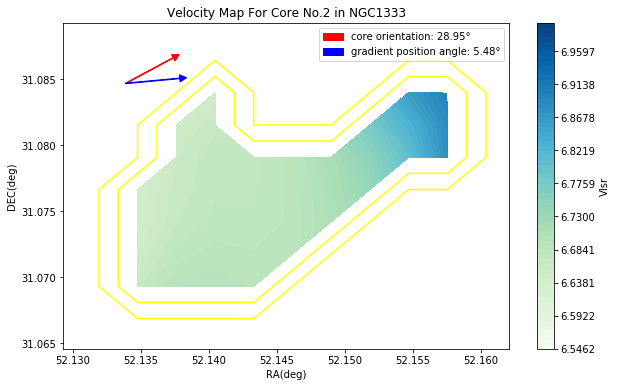

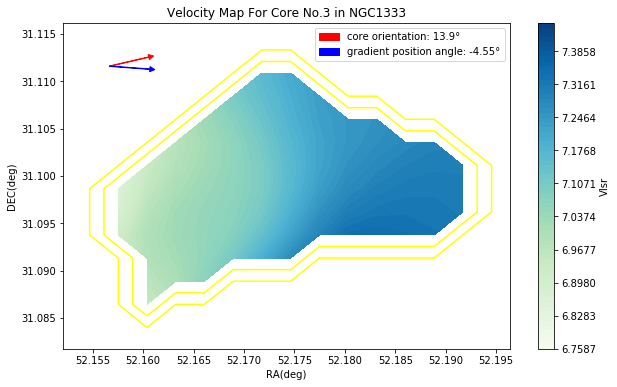

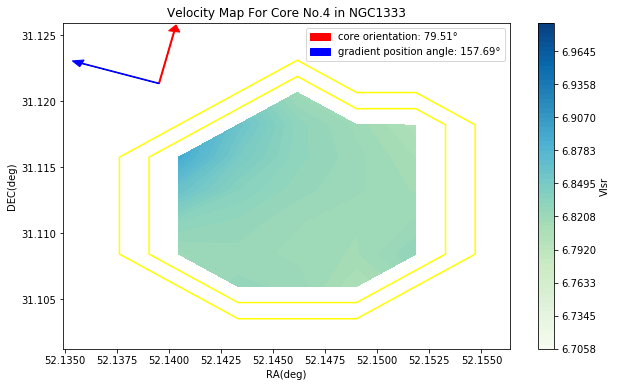

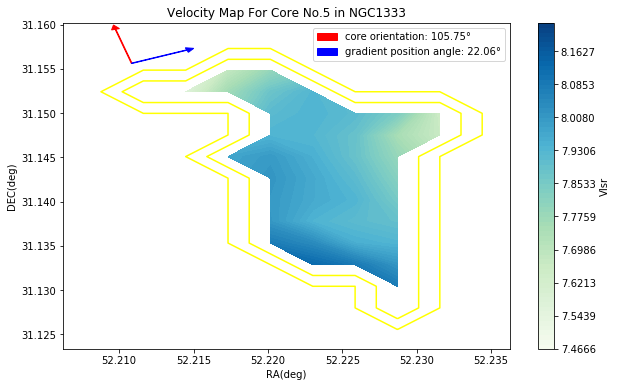

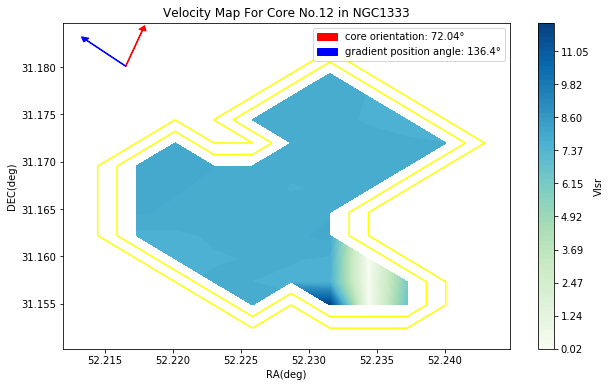

...

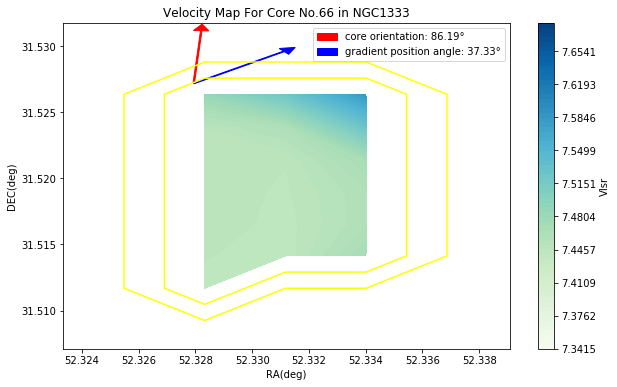

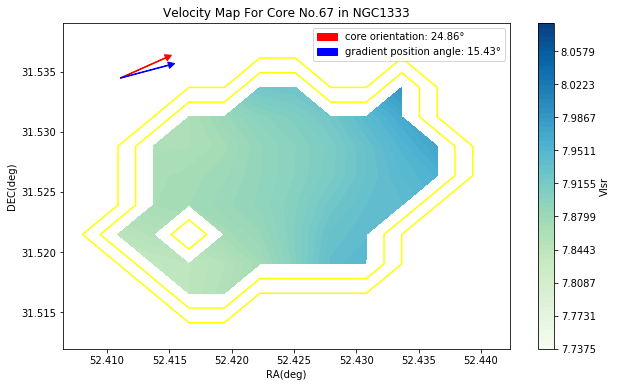

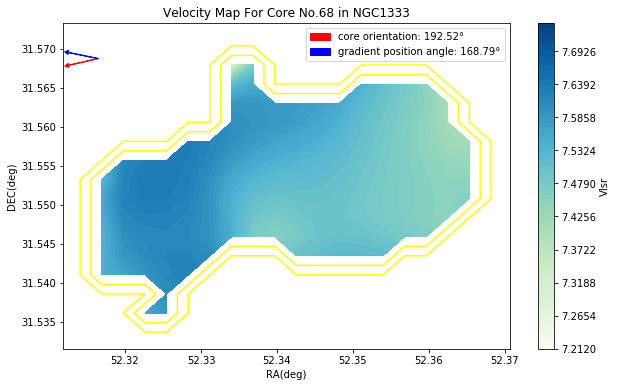

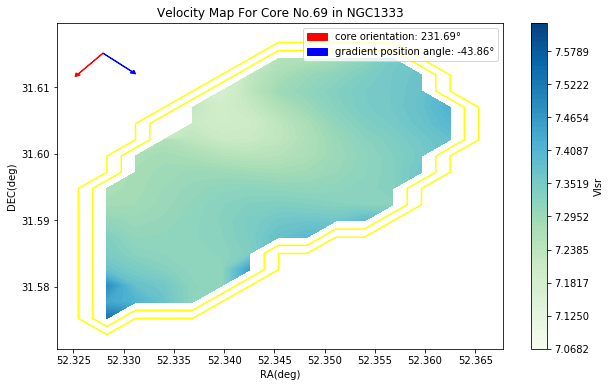

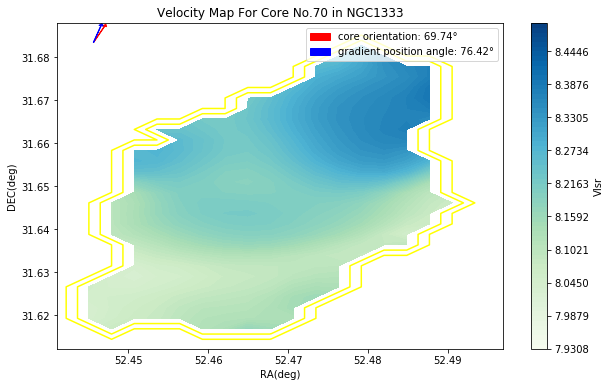

In [56]:
velocity_plot(d1,index1,data1,w1,orientation1,position_angle_d1,slope_x1,slope_y1,'NGC1333')


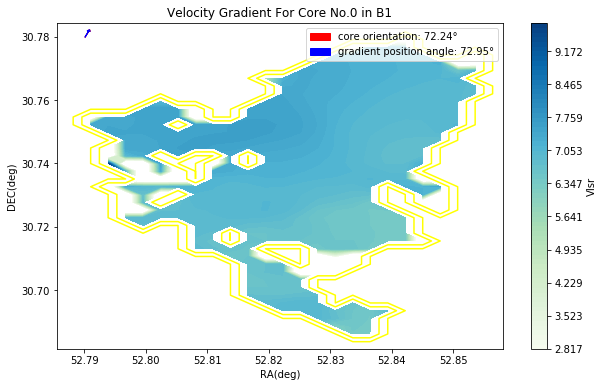

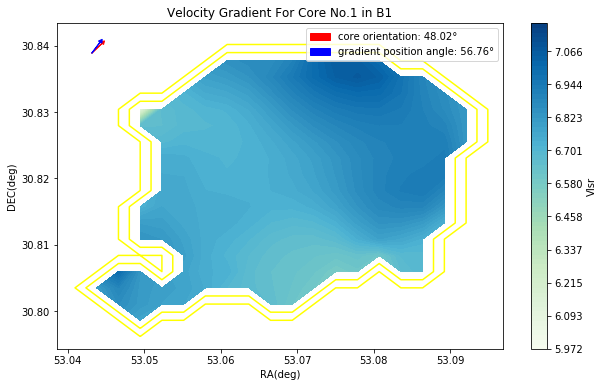

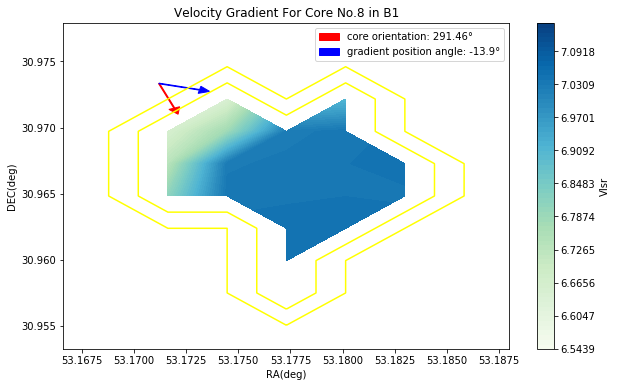

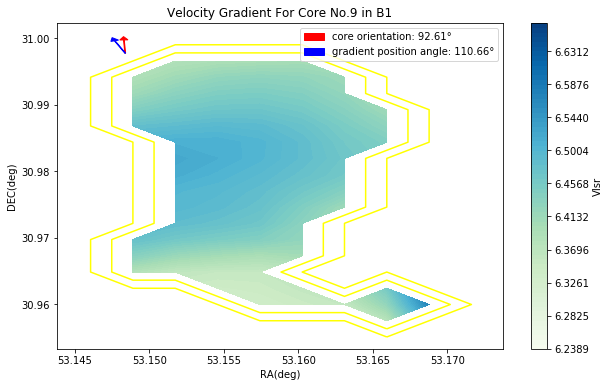

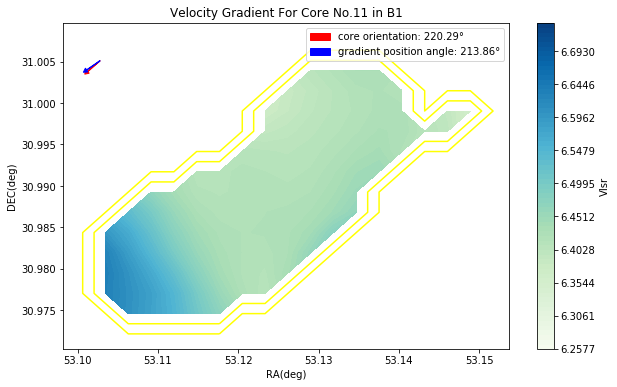

...

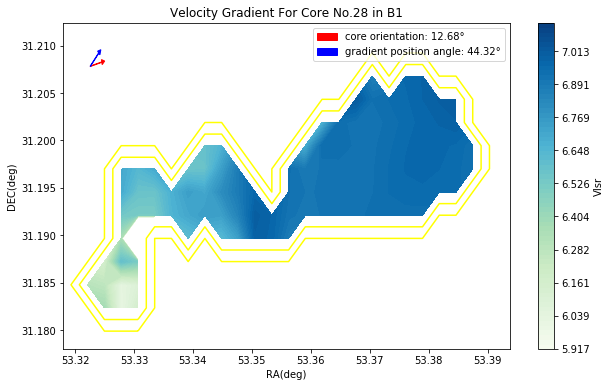

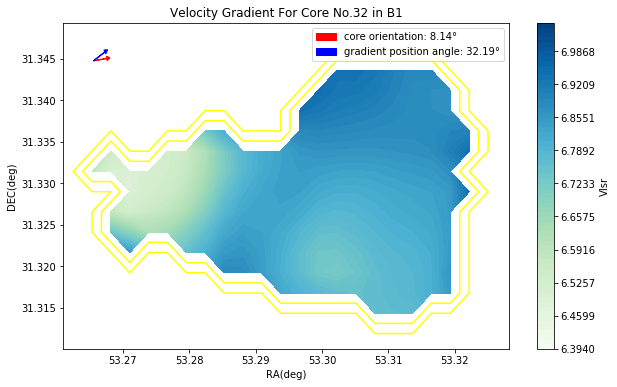

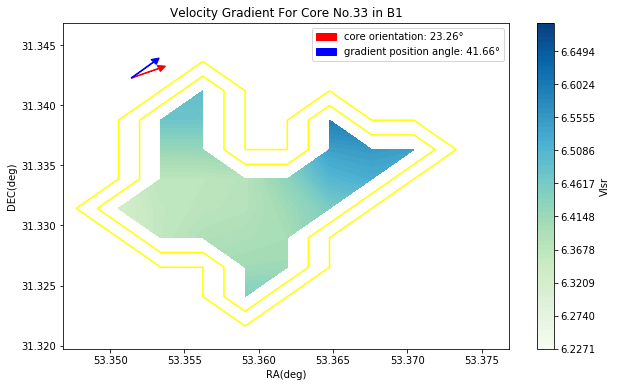

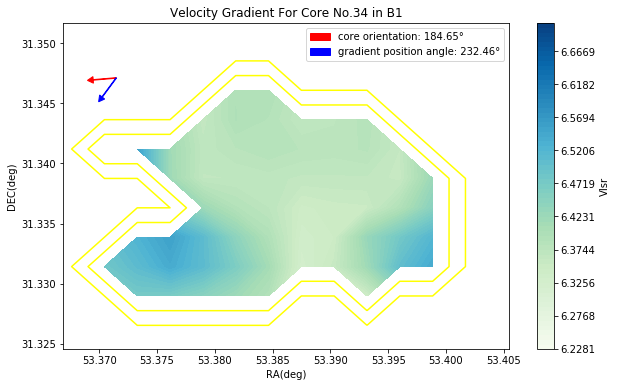

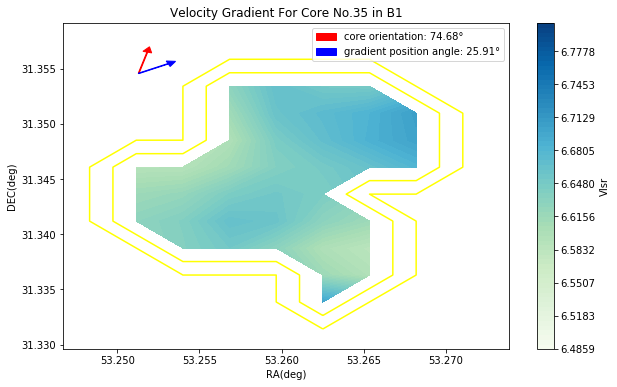

In [24]:
velocity_plot(d2,index2,data2,w2,orientation2,position_angle_d2,slope_x2,slope_y2,'B1')

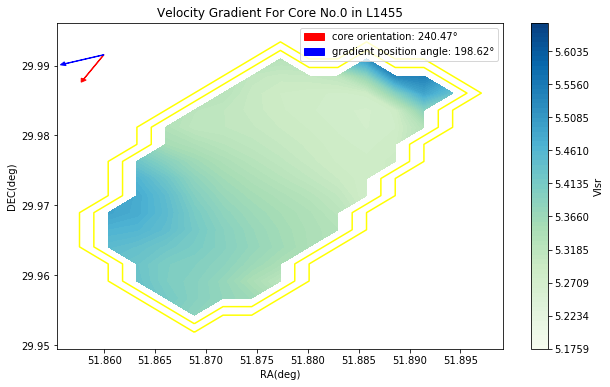

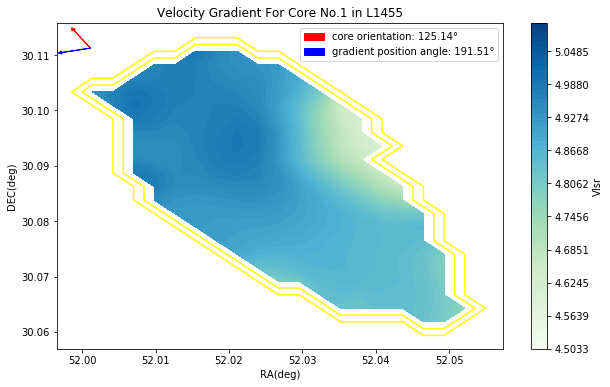

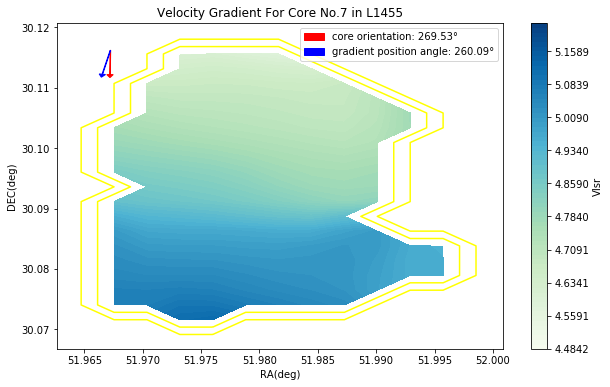

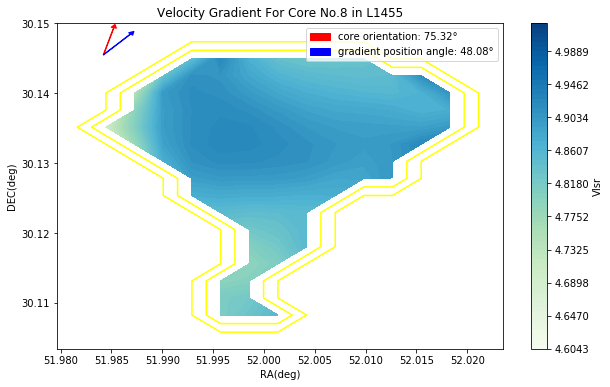

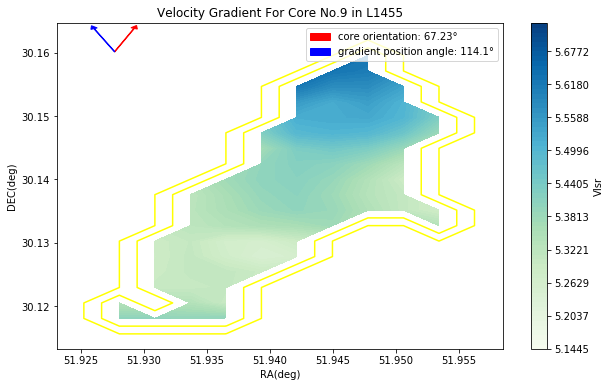

...

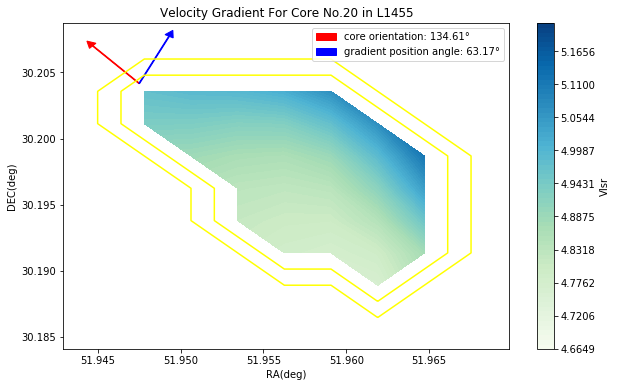

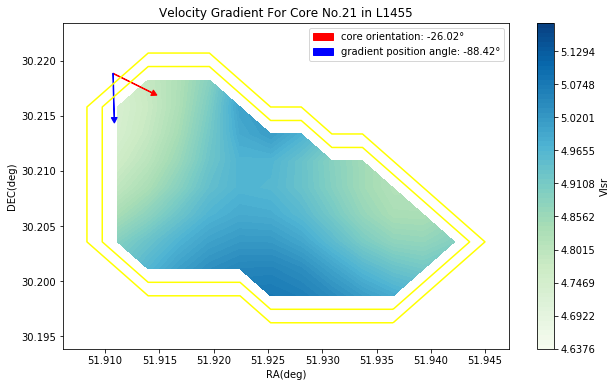

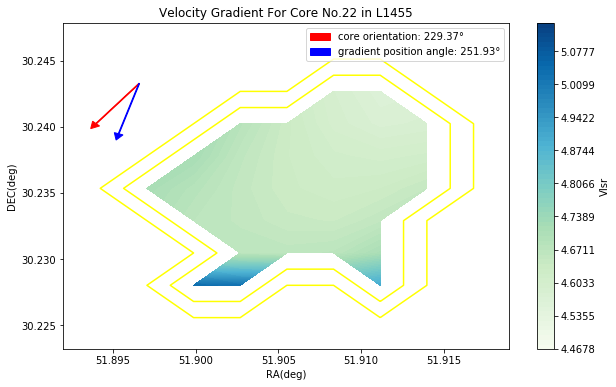

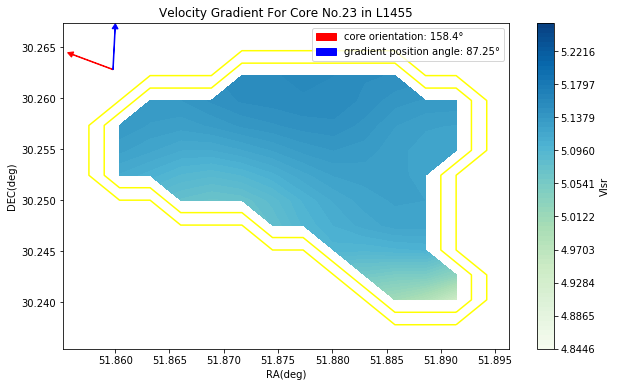

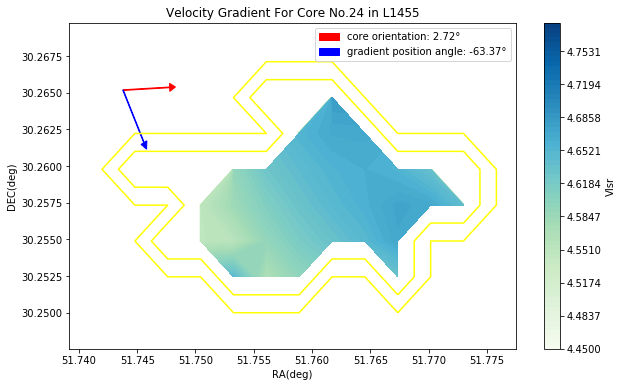

In [31]:
velocity_plot(d3,index3,data3,w3,orientation3,position_angle_d3,slope_x3,slope_y3,'L1455')

    

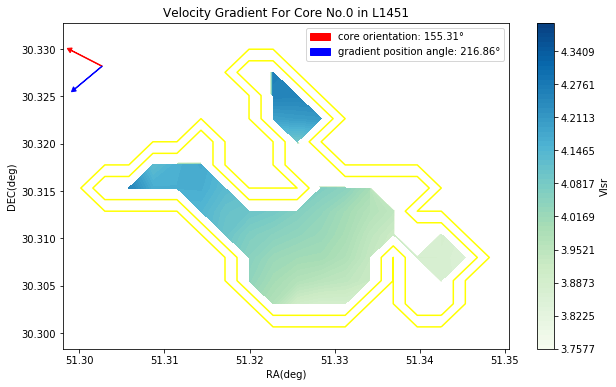

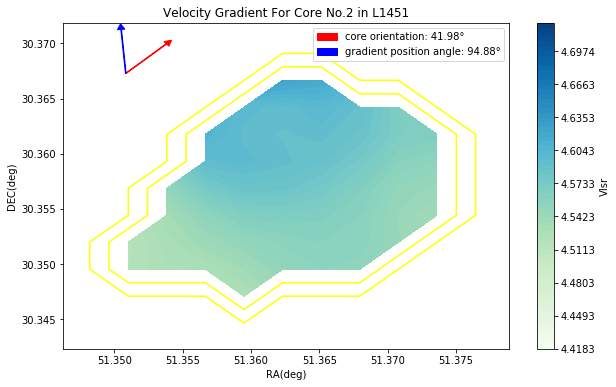

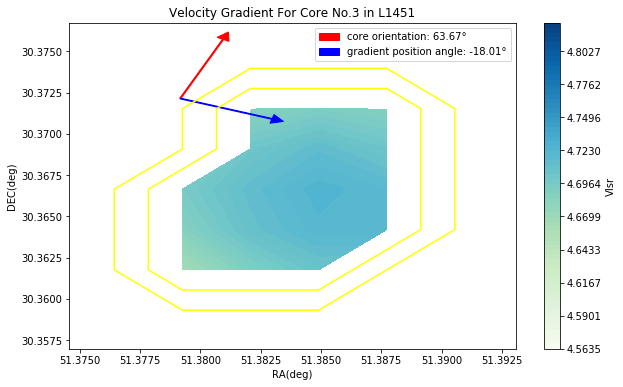

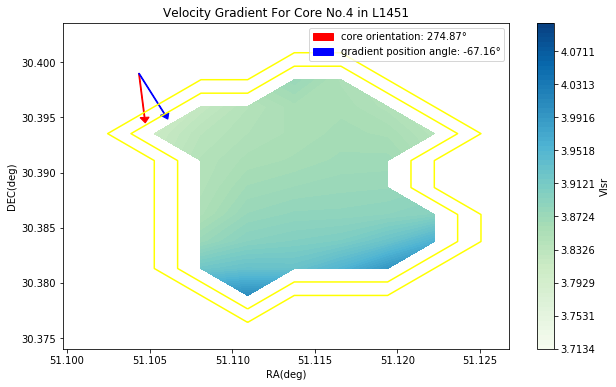

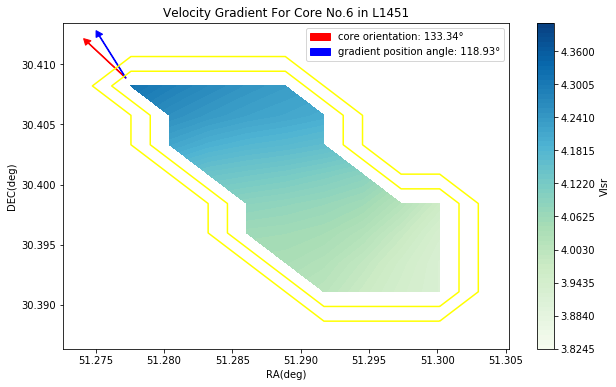

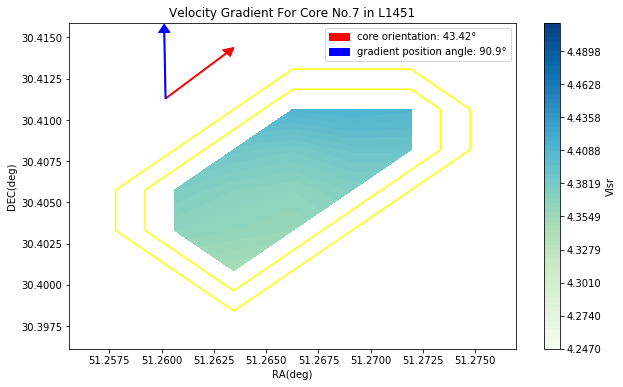

In [32]:
velocity_plot(d4,index4,data4,w4,orientation4,position_angle_d4,slope_x4,slope_y4,'L1451')


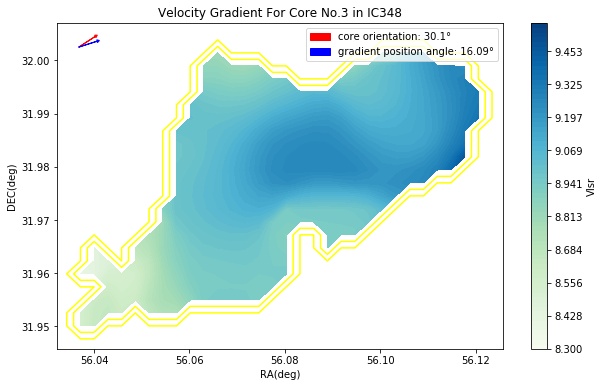

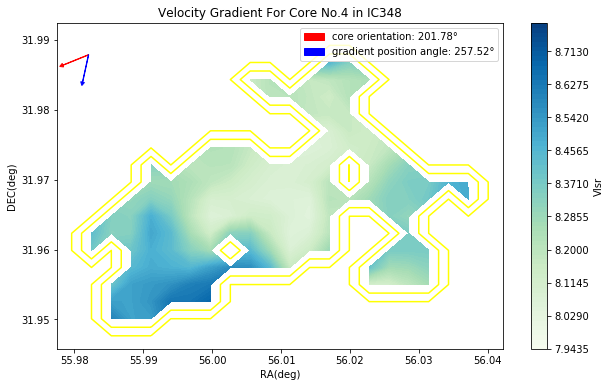

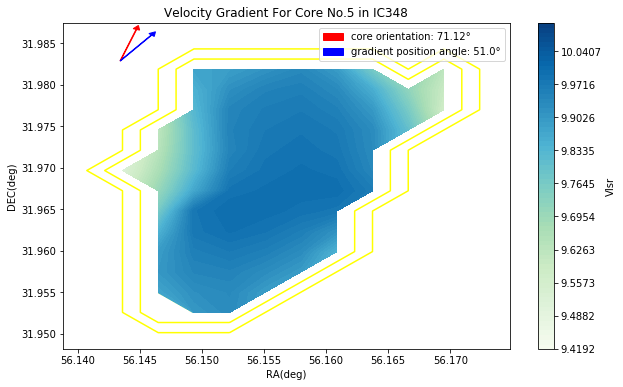

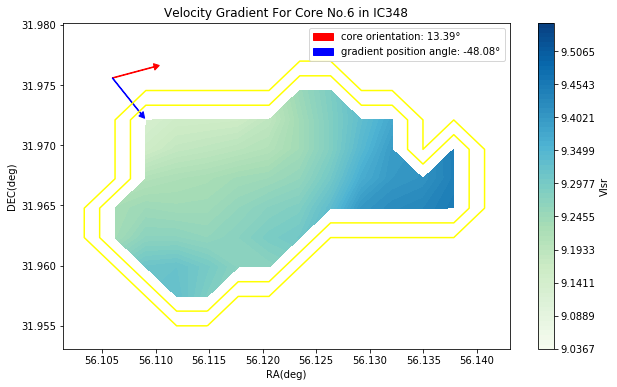

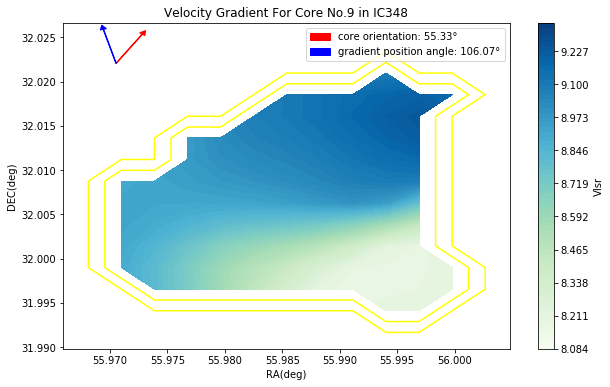

...

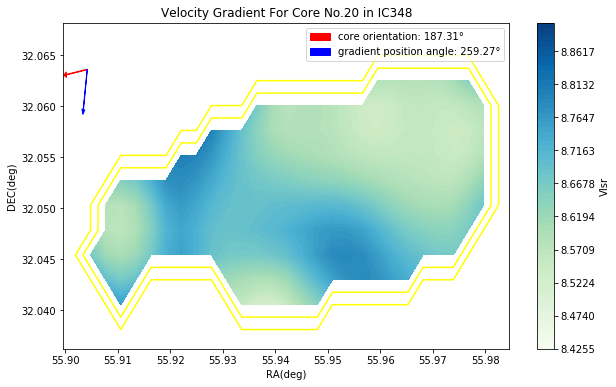

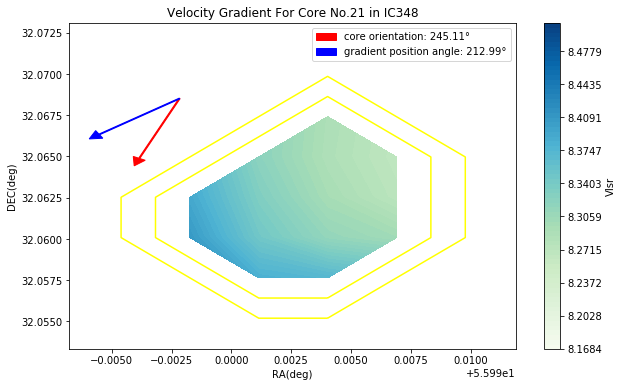

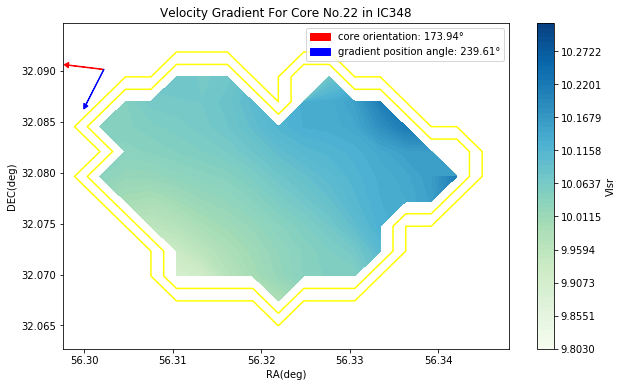

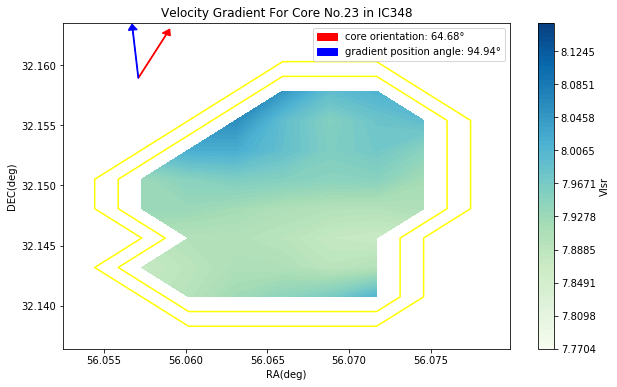

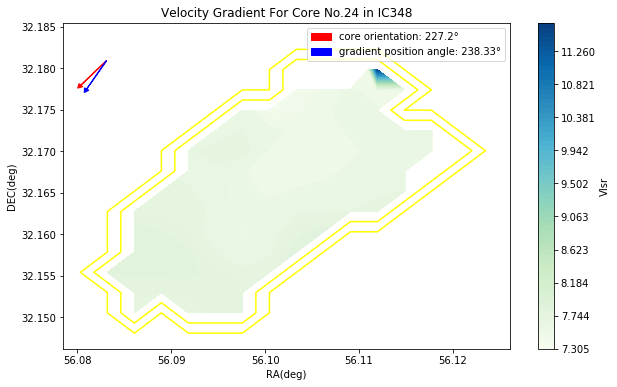

In [33]:
velocity_plot(d5,index5,data5,w5,orientation5,position_angle_d5,slope_x5,slope_y5,'IC348')


In [14]:
''''define function to compute the smallest angle between the core axes orientation and
the velocity gradient direction.'''
def difference_between_angles(index,d,position_angle,orientation):
    new_p=[]
    new_o=[]
    for k in index:
        structure = d[k]
        q = np.argwhere(index==k)[0][0]
        p_angle = position_angle[q]
        o_angle = orientation[q]
        diff = np.absolute(p_angle-o_angle)
        if diff<=90:
            p_angle = p_angle
        else:
            p_angle=p_angle+180 #for difference larger than 90deg,flip the position angle by 180deg
        new_p.append(p_angle)
        new_o.append(o_angle)
    difference = np.absolute(np.array(new_p)-np.array(new_o))
    new_diff = []
    for i in difference:
        if i>180:
            new_diff.append(360-i)
        else:
            new_diff.append(i)
    return np.array(new_diff)

In [15]:
diff_1 = difference_between_angles(index1,d1,position_angle_d1,orientation1)
diff_2 = difference_between_angles(index2,d2,position_angle_d2,orientation2)
diff_3 = difference_between_angles(index3,d3,position_angle_d3,orientation3)
diff_4 = difference_between_angles(index4,d4,position_angle_d4,orientation4)
diff_5 = difference_between_angles(index5,d5,position_angle_d5,orientation5)

In [75]:
#Plots the original velocity map, fitted velocity map, the residual,and the eVlsr map side by side
def gradient_plot(k,d,data,error,w):
    structure = d[k]
    mask = structure.get_mask()
    y,x = structure.indices()
    vel = data[y,x]
    wx,wy = w.wcs_pix2world(x,y,1)
    model = models.Planar2D()
    fitter = fitting.LevMarLSQFitter()
    best_fit = fitter(model,wx,wy,vel)
    slope_x = best_fit.slope_x.value
    slope_y = best_fit.slope_y.value
    v0 = best_fit.intercept.value
    noise = np.nanmean(error[:,:])
    xmin = np.min(wx)
    xmax = np.max(wx)
    ymin = np.min(wy)
    ymax = np.max(wy)
    zero_index = np.argwhere(vel==0)
    vel = np.delete(vel,zero_index)
    vmin = np.min(vel)
    vmax = np.max(vel)
    sy,sx = data.shape
    a = np.linspace(0,sx-1,sx)
    b = np.linspace(0,sy-1,sy)
    wxx,null = w.wcs_pix2world(a,1,1)
    null,wyy = w.wcs_pix2world(1,b,1)
    velocity = np.zeros_like(data)
    for i in range(sx):
        for j in range(sy):
            v = wxx[(i)]*slope_x + wyy[(j)]*slope_y + v0 #generate new velocity values from fitted gradient
            velocity[(j,i)]=v
    levels_data = np.linspace(vmin-0.1,vmax+0.1,70)
    masked_v = np.ma.masked_where(mask==False,velocity)
    masked_data = np.ma.masked_where(mask==False,data)
    masked_noise = np.ma.masked_where(mask==False,error)
    plt.figure(figsize=(30,5))
    plt.subplot(1,4,1)
    plt.contourf(wxx,wyy,masked_v,levels=levels_data,cmap='twilight',alpha=1) #plots fitted velocity map
    plt.xlim(xmax+0.005,xmin-0.005)
    plt.ylim(ymin-0.005,ymax+0.005)
    plt.xlabel("RA(deg)")
    plt.ylabel("DEC(deg)")
    plt.colorbar(label='Vlsr')
    plt.title('Fitted Velocity Gradient of Core No.'+str(k))
    plt.contour(wxx,wyy,mask,levels=True,colors='yellow',alpha=1.0) #highlights core boundary
    plt.subplot(1,4,2)
    plt.contourf(wxx,wyy,masked_data,levels=levels_data,cmap='twilight',alpha=1)#plots original velocity map
    plt.xlim(xmax+0.005,xmin-0.005)
    plt.ylim(ymin-0.005,ymax+0.005)
    plt.xlabel("RA(deg)")
    plt.ylabel("DEC(deg)")
    plt.colorbar(label='Vlsr')
    plt.title("Velocity Gradient For Core No." + str(k))
    plt.contour(wxx,wyy,mask,levels=True,colors='yellow',alpha=1.0)
    plt.subplot(1,4,3)
    residual = masked_data-masked_v
    levels_residual = np.linspace(np.nanmin(residual),np.nanmax(residual),70)
    plt.contourf(wxx,wyy,masked_data-masked_v,levels=levels_residual,cmap='twilight',alpha=1)#plots residual
    plt.xlim(xmax+0.005,xmin-0.005)
    plt.ylim(ymin-0.005,ymax+0.005)
    plt.xlabel("RA(deg)")
    plt.ylabel("DEC(deg)")
    plt.colorbar(label='Vlsr')
    plt.title("Residual For Core No." + str(k))
    plt.contour(wxx,wyy,mask,levels=True,colors='yellow',alpha=1.0)
    plt.subplot(1,4,4)
    plt.contourf(wxx,wyy,error,levels=levels_residual,cmap='twilight',alpha=1)#plots error map
    plt.xlim(xmax+0.005,xmin-0.005)
    plt.ylim(ymin-0.005,ymax+0.005)
    plt.xlabel("RA(deg)")
    plt.ylabel("DEC(deg)")
    plt.colorbar(label='eVlsr')
    plt.title("Noise For Core No." + str(k))
    plt.contour(wxx,wyy,mask,levels=True,colors='yellow',alpha=1.0)

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in true_divide
  
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


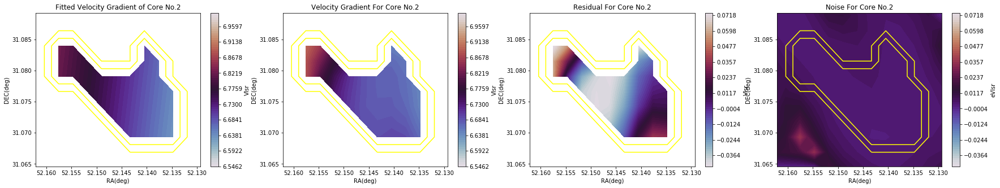

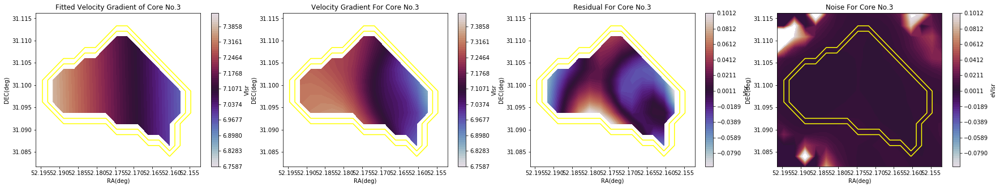

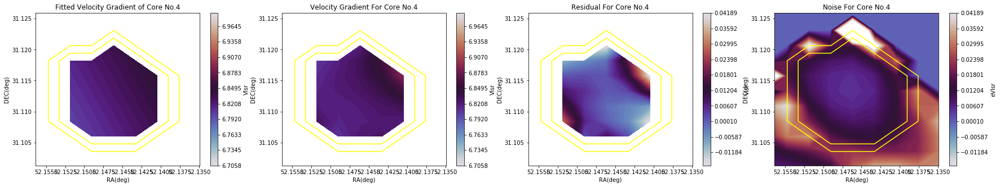

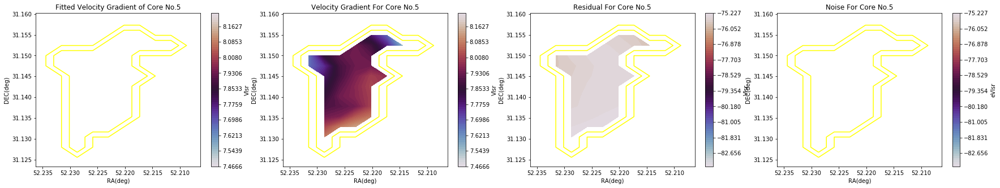

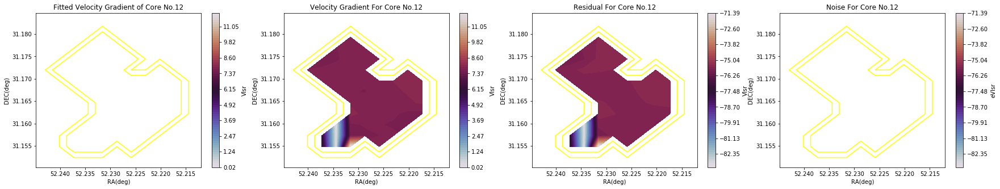

...

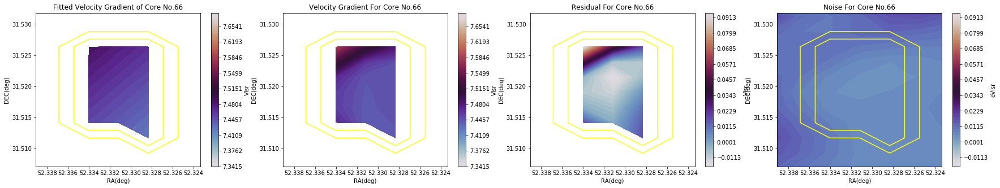

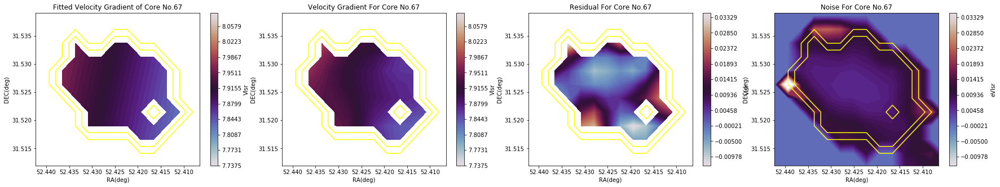

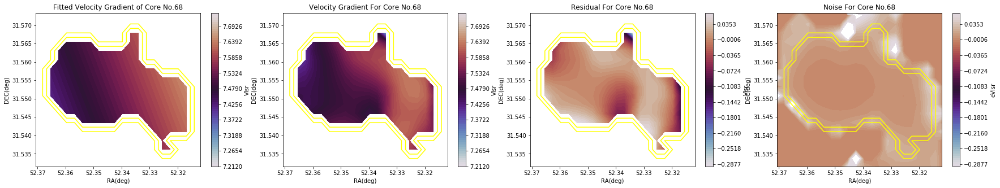

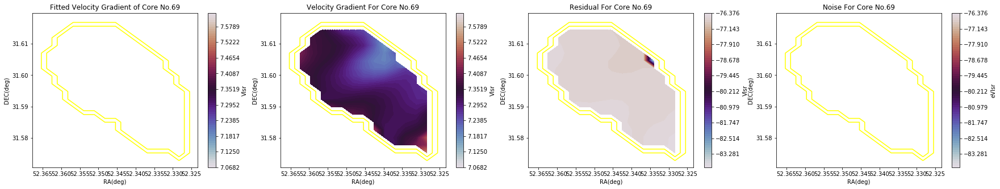

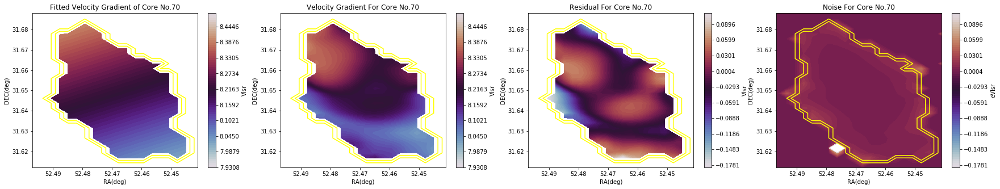

In [76]:
for k in index1:
    gradient_plot(k,d1,data1,error1,w1)

# Checking for Protostars

In [16]:
with open('/home/student04/Newrepos/c2d_dunham_table2_edit.txt','r')as f:
    all_data = [line.strip()for line in f.readlines()]
perseus_data = all_data[2378:2763] #selects protostellar sources from Perseus

In [17]:
#Identifies the equatorial coordinates of protostellar sources
RA = []
DEC = []
for i in perseus_data:
    info = i.split()
    ra = f'{info[2]}h{info[3]}m{info[4]}s'
    dec = f'{info[5]}d{info[6]}m{info[7]}s'
    RA.append(ra)
    DEC.append(dec)
ra_deg=[]
dec_deg=[]
for k in range(len(RA)):
    c = SkyCoord(RA[k],DEC[k],frame='icrs')
    ra = c.ra.value
    dec = c.dec.value
    ra_deg.append(ra)
    dec_deg.append(dec)

In [18]:
def check_protostars(index,d,data,w):
    protostellar = []
    for i in index:
        structure = d[i]
        mask = structure.get_mask()
        yy,xx=structure.indices()
        sy,sx = data.shape
        a = np.linspace(0,sx-1,sx)
        b = np.linspace(0,sy-1,sy)
        wxx,null = w.wcs_pix2world(a,1,1)
        null,wyy = w.wcs_pix2world(1,b,1)
        wx,wy = w.wcs_pix2world(xx,yy,1)
        xmin = np.min(wx)
        xmax = np.max(wx)
        ymin = np.min(wy)
        ymax = np.max(wy)
        protostellar_checker=[]
        for k in range(len(RA)):
            if xmin<=ra_deg[k]<=xmax and ymin<=dec_deg[k]<=ymax:
                ''''checks whether a protostar is within the boundary of a core'''
                protostellar_checker.append(False)
            else:
                protostellar_checker.append(True)
        if np.all(protostellar_checker)==False:
            protostellar.append(i)
    return protostellar

In [19]:
#list of protostellar cores
stars1 = check_protostars(index1,d1,data1,w1)
stars2 = check_protostars(index2,d2,data2,w2)
stars3 = check_protostars(index3,d3,data3,w3)
stars4 = check_protostars(index4,d4,data4,w4)
stars5 = check_protostars(index5,d5,data5,w5)

In [20]:
#returns actual indices of protostellar cores out of a list of all cores
def actual_index(stars,index):
    actual = []
    for i in stars:
        actual.append(np.where(index==i)[0][0])
    return actual

In [21]:
#returns the indices of starless cores
def starless(array,stars,index):
    starless_array = np.delete(array,actual_index(stars,index))
    return starless_array

In [22]:
#returns the indices of protostellar cores
def protostellar(array,stars,index):
    protostellar_array = np.take(array,actual_index(stars,index))
    return protostellar_array

# Cumulative Distribution Function

In [23]:
#defines a function that plots the step function of difference between core PA and gradient orientation
def step_function(diff):
    X = np.sort(diff)
    ecdf = sm.distributions.ECDF(X)
    Y = ecdf(X)
    x_values = [min(X),max(X)]
    y_values = [min(Y),max(Y)]
    plt.plot(x_values,y_values,'r--')
    plt.step(X,Y)

In [28]:
''''Because the outflow of materials in protostellar cores may disrupt the gas, we need to separate
cores into two different types, starless and protostellar.'''
def separate_different_cores(diff,index,d,stars,position_angle,orientation,name):
    plt.figure(figsize=(15,3))
    plt.subplot(1,3,1)
    step_function(diff)
    plt.title('CDF of '+ name + ' : All Cores')
    plt.xlabel('Difference PA and Fitted Velocity Gradient')
    plt.ylabel('Normalized CDF')
    if protostellar(index,stars,index).size != 0: #makes sure the code doesn't crash in case there aren't any protostellar cores
        plt.subplot(1,3,2)
        plt.xlabel('Difference PA and Fitted Velocity Gradient')
        plt.ylabel('Normalized CDF')
        step_function(difference_between_angles(starless(index,stars,index),d,starless(position_angle,stars,index),starless(orientation,stars,index)))
        plt.title('CDF of '+ name + ' : Starless Cores')
        plt.subplot(1,3,3)
        step_function(difference_between_angles(protostellar(index,stars,index),d,protostellar(position_angle,stars,index),protostellar(orientation,stars,index)))
        plt.title('CDF of '+ name + ' : Protostellar Cores')  
        plt.xlabel('Difference PA and Fitted Velocity Gradient')
        plt.ylabel('Normalized CDF')
    else:
        pass

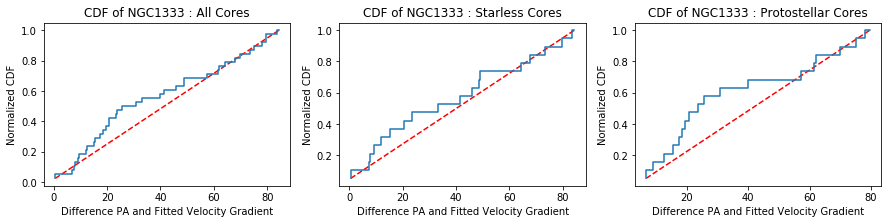

In [29]:
separate_different_cores(diff_1,index1,d1,stars1,position_angle_d1,orientation1,'NGC1333')

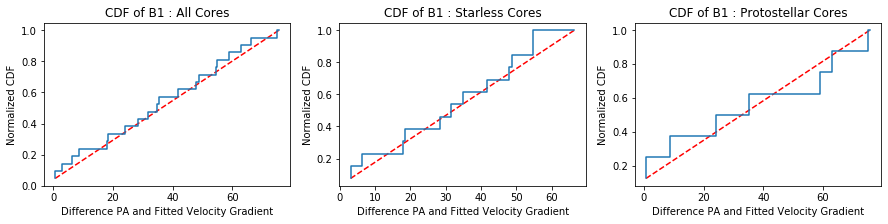

In [30]:
separate_different_cores(diff_2,index2,d2,stars2,position_angle_d2,orientation2,'B1')

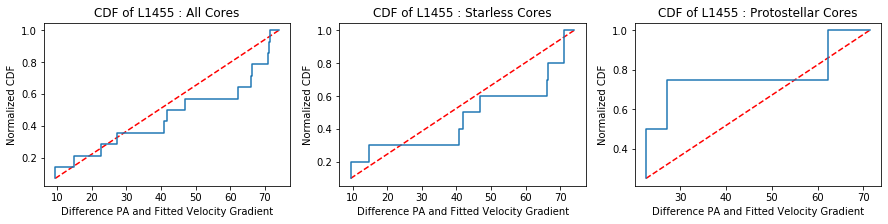

In [31]:
separate_different_cores(diff_3,index3,d3,stars3,position_angle_d3,orientation3,'L1455')

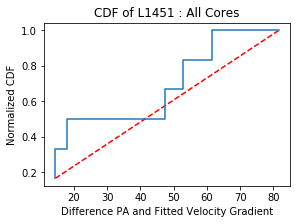

In [32]:
separate_different_cores(diff_4,index4,d4,stars4,position_angle_d4,orientation4,'L1451')

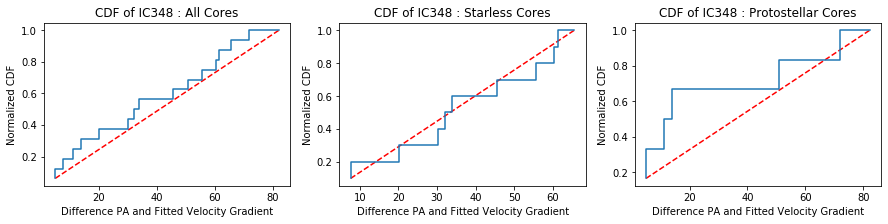

In [33]:
separate_different_cores(diff_5,index5,d5,stars5,position_angle_d5,orientation5,'IC348')

# Reduced Chi Square

In [64]:
#computes the reduced chi square of each core to see whether the fit represents the velocity properties well
def chisquare(index,d,data,error,w):
    chisq = []
    for k in index:
        structure = d[k]
        mask = structure.get_mask()
        y,x = structure.indices()
        vel = data[y,x]
        wx,wy = w.wcs_pix2world(x,y,1)
        model = models.Planar2D()
        fitter = fitting.LevMarLSQFitter()
        best_fit = fitter(model,wx,wy,vel)
        slope_x = (best_fit.slope_x.value)
        slope_y = (best_fit.slope_y.value)
        v0 = (best_fit.intercept.value)
        masked_data = np.ma.masked_where(mask==False,data)#original velocity data
        masked_error = np.ma.masked_where(mask==False,error)#eVlsr
        sy,sx = data.shape
        a = np.linspace(0,sx-1,sx)
        b = np.linspace(0,sy-1,sy)
        wxx,null = w.wcs_pix2world(a,1,1)
        null,wyy = w.wcs_pix2world(1,b,1)
        velocity = np.zeros_like(data)
        for i in range(sx):
            for j in range(sy):
                v = wxx[(i)]*slope_x + wyy[(j)]*slope_y + v0
                velocity[(j,i)]=v
        masked_v = np.ma.masked_where(mask==False,velocity)#fitted velocity data
        chi = np.zeros_like(masked_data)
        for i in x:
            for j in y:
                s = (masked_data[j,i]-masked_v[j,i])**2/((len(wx)-3)*(masked_error[j,i])**2) 
                chi[(j,i)]=s
        chisq.append(np.sum(chi))
    return np.array(chisq)

In [65]:
chi1 = chisquare(index1,d1,data1,error1,w1)

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in double_scalars


In [66]:
chi2 = chisquare(index2,d2,data2,error2,w2)

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in double_scalars


In [67]:
chi3 = chisquare(index3,d3,data3,error3,w3)

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in double_scalars


In [68]:
chi4 = chisquare(index4,d4,data4,error4,w4)

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in double_scalars


In [69]:
chi5 = chisquare(index5,d5,data5,error5,w5)

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: divide by zero encountered in double_scalars


In [70]:
#Creates a table summarizing the reduced chi square value for each core
def Chi_Table(name,index,chi,stars):
    N = len(chi)
    dtype = [(name+': '+'Core Number','i4'),('Reduced Chi-Square','f4'),('Core Type','str')]
    t = Table(data=np.zeros(N,dtype=dtype))
    protostars_cores = actual_index(stars,index)
    for i in range(N):
        if i in protostars_cores:
            t[i]=[index[i],chi[i],'protostellar']
        else:
            t[i]=[index[i],chi[i],'starless']
    return t

In [91]:
#removes any core with infinite chi square value (indication of very bad fit)
def remove_inf(array,chi):
    new_array = np.delete(array,np.where(np.isinf(chi)))
    return new_array
    

In [92]:
#Makes two separate chi square tables of protostellar cores and starless cores
def separate_chi(name,index,chi,stars):
    t1 = Chi_Table(name,remove_inf(index,chi),remove_inf(chi,chi),remove_inf(stars,chi))
    p = list(actual_index(remove_inf(stars,chi),remove_inf(index,chi)))
    s = np.where(np.isin(list(np.arange(0,len(remove_inf(index,chi)))),p)==False)[0]
    p_chi = np.take(remove_inf(chi,chi),p)
    s_chi = np.delete(remove_inf(chi,chi),p)
    print(t1[p],'mean for protostellar cores: ',np.mean(p_chi))
    print(t1[s],'mean for starless cores: ',np.mean(s_chi))


In [93]:
separate_chi('NGC1333',index1,chi1,stars1)

NGC1333: Core Number Reduced Chi-Square Core Type
-------------------- ------------------ ---------
                   3          137.92267         p
                   4          0.9766059         p
                  14           86.46658         p
                  31          261.43387         p
                  33          1043.7896         p
                  37          302.85547         p
                  39             148.12         p
                  40           5.332109         p
                  41          4.1345463         p
                  42          55.407738         p
                  46         12.6299095         p
                  49         102.902306         p
                  51          82.289444         p
                  52          2.3584492         p
                  62           47.39434         p
                  68            20.0923         p
                  70           98.72671         p mean for protostellar cores:  141.93132854615843
N

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.
  
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.

In [94]:
separate_chi('B1',index2,chi2,stars2)

B1: Core Number Reduced Chi-Square Core Type
--------------- ------------------ ---------
              1           74.70109         p
             13          503.28427         p
             18          129.37054         p
             25          400.89038         p
             26          326.14893         p
             27           82.84469         p
             32          54.215847         p mean for protostellar cores:  224.4936806048568
B1: Core Number Reduced Chi-Square Core Type
--------------- ------------------ ---------
              8          132.62807         s
              9          39.714973         s
             11           63.59748         s
             12          4.1884103         s
             14          0.4336412         s
             16           43.94471         s
             17           4.441396         s
             20            8.35257         s
             22          11.096946         s
             33          3.2849722         s
       

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.
  
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.

In [95]:
separate_chi('L1455',index3,chi3,stars3)

L1455: Core Number Reduced Chi-Square Core Type
------------------ ------------------ ---------
                 8           48.80156         p
                20          106.98667         p
                21          353.73627         p
                22          71.706215         p mean for protostellar cores:  145.3076754875388
L1455: Core Number Reduced Chi-Square Core Type
------------------ ------------------ ---------
                 0           81.21439         s
                 1           85.39263         s
                 7          23.628126         s
                 9           5.538385         s
                13           8.217166         s
                14           8.792484         s
                15           5.729385         s
                17          17.105013         s
                23          16.421064         s mean for starless cores:  28.004294514775317


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.
  
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.

In [96]:
separate_chi('L1451',index4,chi4,stars4)

L1451: Core Number Reduced Chi-Square Core Type
------------------ ------------------ --------- mean for protostellar cores:  nan
L1451: Core Number Reduced Chi-Square Core Type
------------------ ------------------ ---------
                 2           4.912693         s
                 3          3.5591497         s
                 4           2.662859         s
                 6          15.027412         s
                 7          1.2836227         s mean for starless cores:  5.489147321713273


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.
  
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.

In [97]:
separate_chi('IC348',index5,chi5,stars5)

IC348: Core Number Reduced Chi-Square Core Type
------------------ ------------------ ---------
                 3           529.1965         p
                 9           588.7153         p
                19          271.76285         p
                20          142.11465         p mean for protostellar cores:  382.94730437811995
IC348: Core Number Reduced Chi-Square Core Type
------------------ ------------------ ---------
                 4          13.683742         s
                 6          2.9716752         s
                11          15.804144         s
                13           6.311791         s
                16          3.1857908         s
                18          61.070942         s
                21          6.6485353         s
                23          2.3464422         s mean for starless cores:  14.00288273803286


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning: in the future out of bounds indices will raise an error instead of being ignored by `numpy.delete`.
  
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.7.3/lib/python3.7/site-packages/astropy/table/table.py:2600: StringTruncateWarning: truncated right side string(s) longer than 1 character(s) during assignment
  cols[name][idx] = val
/opt/python/3.

In [98]:
#identify cores with reduced chi square values lower or equal to 7
def low_chi_cores(name,index,chi,stars):
    s = np.delete(np.arange(0,len(chi)),actual_index(stars,index))
    low_chi_indices = []
    low_chi_cores = []
    for i in s:
        if chi[i]<=7:
            low_chi_indices.append(i)
            low_chi_cores.append(index[i])
    return np.array(low_chi_indices),np.array(low_chi_cores)

In [99]:
low_chi_indices1,low_chi_cores1 = low_chi_cores('NGC1333',index1,chi1,stars1)

In [100]:
low_chi_indices2,low_chi_cores2 = low_chi_cores('B1',index2,chi2,stars2)

In [101]:
low_chi_indices4,low_chi_cores4 = low_chi_cores('L1451',index4,chi4,stars4)

In [102]:
low_chi_indices5,low_chi_cores5 = low_chi_cores('IC348',index5,chi5,stars5)

# Local Velocity Gradient

In [103]:
def sigmoid(x, x0, k):
    y = 1/ (1 + np.exp(-k*(x-x0)))
    return (y)

In [109]:
#plots the step function for gradient orientation per pixel
def gradient_per_pixel(k,index,d,data,w,name,orientation):
        structure = d[k]
        q = np.argwhere(index==k)[0][0]
        yy,xx = structure.indices()
        wx,wy = w.wcs_pix2world(xx,yy,1)
        mask = structure.get_mask()
        masked_data = np.ma.masked_where(mask==False,data)
        grad_orientation = []
        for i in xx:
            for j in yy:
                ''''creates 3*3 box around each pixel in core to estimate 
                gradient orientation per pixel''''
                x = np.array([i-1,i-1,i-1,i,i,i,i+1,i+1,i+1])
                y = np.array([j-1,j,j+1,j-1,j,j+1,j-1,j,j+1])
                vel = masked_data[list(y),list(x)]
                model = models.Planar2D()
                fitter = fitting.LevMarLSQFitter()
                best_fit = fitter(model,x,y,vel)
                slope_x = (best_fit.slope_x.value)
                slope_y = (best_fit.slope_y.value)
                angle = ((np.arctan(slope_y/slope_x)*u.rad).to(u.deg))/(1*u.deg)
                grad_orientation.append(angle)
        g = np.array(grad_orientation)  
        grad_eachpixel = np.sort(np.ma.masked_where(np.isnan(g)==True,g))
        X = grad_eachpixel
        ecdf = sm.distributions.ECDF(X)
        Y = ecdf(X)
        new_g = np.sort(g)
        p0=[np.nanmean(X),1]#initial guess for logistic curve fit
        XX = np.delete(new_g,np.where(np.isnan(new_g)==True))
        popt,pcov = opt.curve_fit(sigmoid,XX,ecdf(XX),p0,method='dogbox')
        YY = sigmoid(XX,*popt)
        x_values = [min(X),max(X)]
        y_values = [min(Y),max(Y)]
        plt.figure()
        plt.axvline(np.nanmedian(XX),color='black',linestyle='--')
        plt.step(X,Y,'g')
        plt.plot(XX,YY,'r')
        plt.title('CDF of Gradient per Pixel for Core No.'+str(k)+' of '+ name)
        plt.legend()

In [13]:
#adjust gradient orientation so that it has the same range with core PA
def new_orientation(orientation):
    o = []
    for i in orientation:
        if -90<i<90:
            o.append(-i)
        elif 90<i<270:
            o.append(180-i)
    return np.array(o)

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
No handles with labels found to put in legend.
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
No handles with labels found to put in legend.
No handles with labels found to put in legend.
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
No handles with labels found to put in legend.
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launc

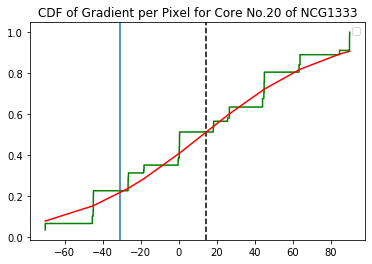

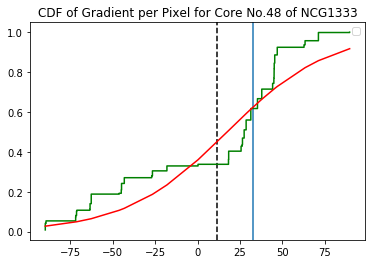

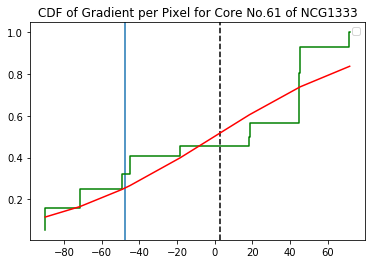

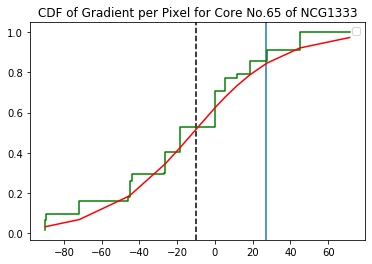

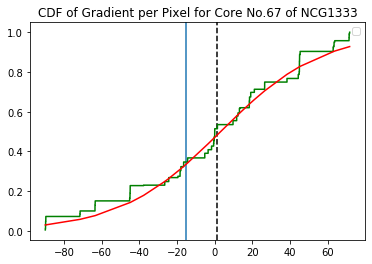

In [266]:
for k in low_chi_cores1:
    gradient_per_pixel(k,index1,d1,data1,w1,'NCG1333',new_orientation(orientation1))

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
No handles with labels found to put in legend.
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
No handles with labels found to put in legend.
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in double_scalars
No handles with labels found to put in legend.
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: Runtime

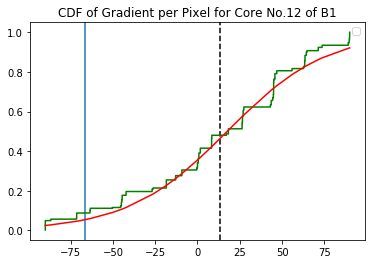

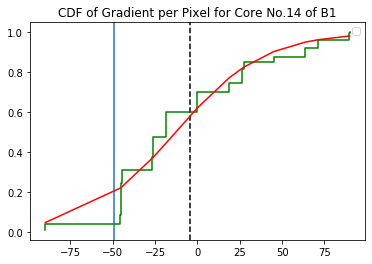

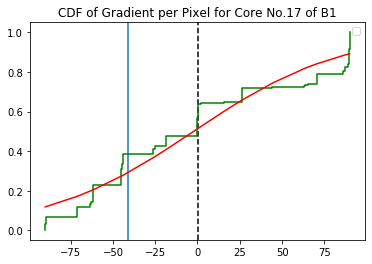

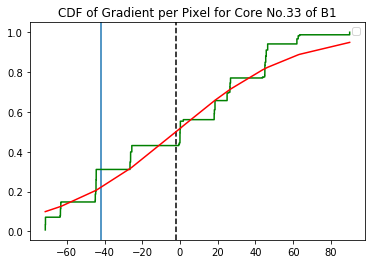

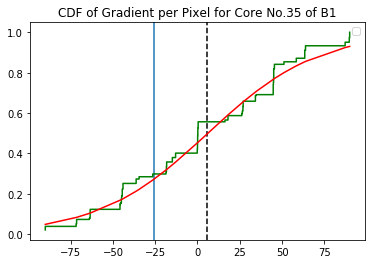

In [49]:
for k in low_chi_cores2:
    gradient_per_pixel(k,index2,d2,data2,w2,'B1',new_orientation(orientation2))

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in double_scalars
No handles with labels found to put in legend.


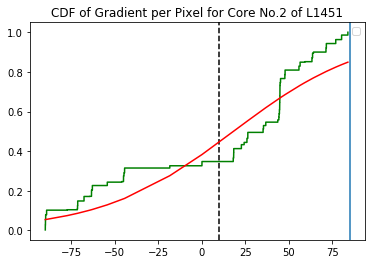

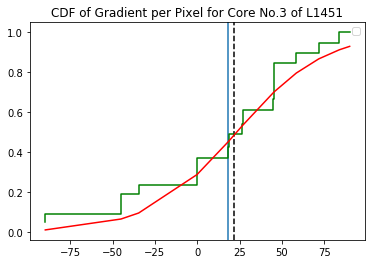

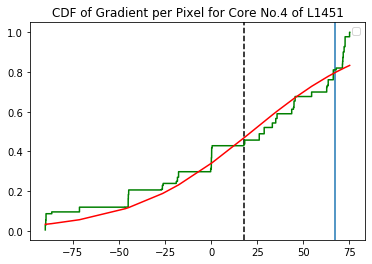

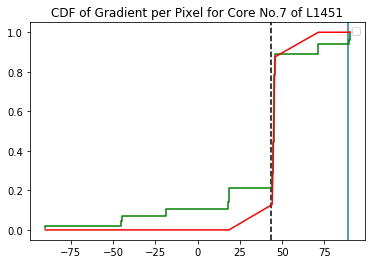

In [50]:
for k in low_chi_cores4:
    gradient_per_pixel(k,index4,d4,data4,w4,'L1451',new_orientation(orientation4))

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in double_scalars
No handles with labels found to put in legend.
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
No handles with labels found to put in legend.


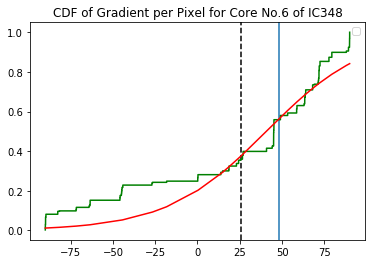

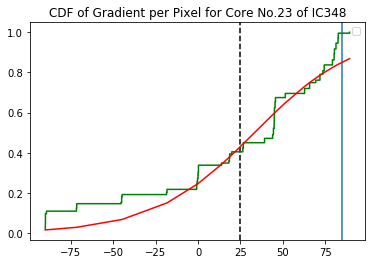

In [51]:
for k in low_chi_cores5:
    gradient_per_pixel(k,index5,d5,data5,w5,'IC348',new_orientation(orientation5))

# Monte Carlo Uncertainty Analysis

In [106]:
from scipy.stats import norm

In [107]:
''''generates 100 sets of new velocity values and approximate as a normal distribution.
The mean and standard deviation of the normal distribution correspond to the estimated gradient
orientation and uncertainty, respectively.'''
def Monte_Carlo(k,d,data,error,w):
    np.random.seed(4)
    structure = d[k]
    mask = structure.get_mask()
    y,x = structure.indices()
    wx,wy = w.wcs_pix2world(x,y,1)
    o_list=[]
    for k in range(100):
        masked_data = np.ma.masked_where(mask==False,data1)
        for i in x:
            for j in y:
                new_vel = np.random.normal(loc = data[j,i],scale=error[j,i])#randomly draws values from a gaussian with mean of velocity value at this pixel and standard deviation of eVlsr
                masked_data[(j,i)]=new_vel  
        vel = masked_data[y,x]
        model = models.Planar2D()
        fitter = fitting.LevMarLSQFitter()
        best_fit = fitter(model,wx,wy,vel)
        slope_x = (best_fit.slope_x.value)
        slope_y = (best_fit.slope_y.value)
        angle = ((np.arctan(slope_y/slope_x)*u.rad).to(u.deg))/(1*u.deg)
        o_list.append(angle) 
    new_list = new_orientation(np.array(o_list))
    mu,sigma = np.mean(new_list),np.std(new_list)
    return mu,sigma

In [80]:
def new_index(d,index):
    new_i = []
    for k in index:
        structure = d[k]
        mask = structure.get_mask()
        y,x = structure.indices()
        if len(y)>50:#eliminates cores that have too many pixels (which takes forever to run)
            pass
        else:
            new_i.append(k)
    return np.array(new_i)

In [81]:
new_index1 =new_index(d1,index1)

/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in double_scalars
No handles with labels found to put in legend.


2


No handles with labels found to put in legend.


4


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in double_scalars
No handles with labels found to put in legend.


5


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
No handles with labels found to put in legend.


15


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
No handles with labels found to put in legend.


20


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
No handles with labels found to put in legend.


28


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
No handles with labels found to put in legend.


35


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in double_scalars
No handles with labels found to put in legend.


37


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
No handles with labels found to put in legend.


38


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
No handles with labels found to put in legend.


40


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
No handles with labels found to put in legend.


41


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
No handles with labels found to put in legend.


44


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
No handles with labels found to put in legend.


46


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
No handles with labels found to put in legend.


48


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
No handles with labels found to put in legend.


51


No handles with labels found to put in legend.


58


No handles with labels found to put in legend.


61


/opt/python/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
No handles with labels found to put in legend.


65


No handles with labels found to put in legend.


66


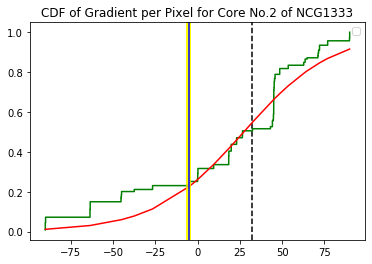

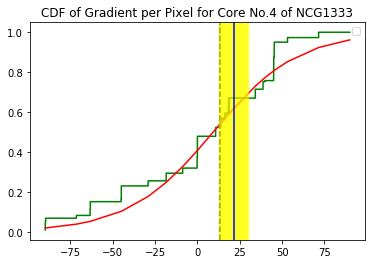

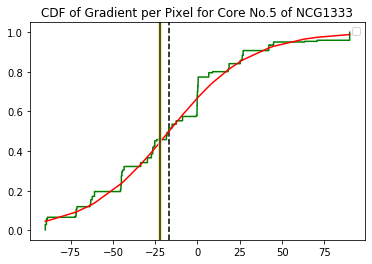

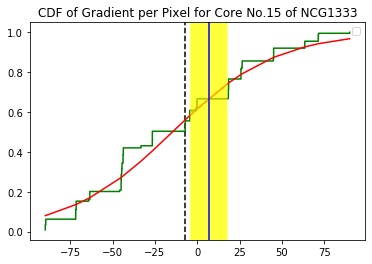

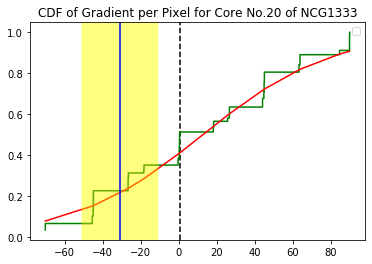

...

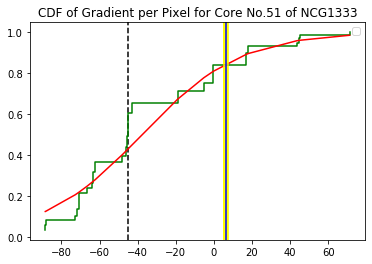

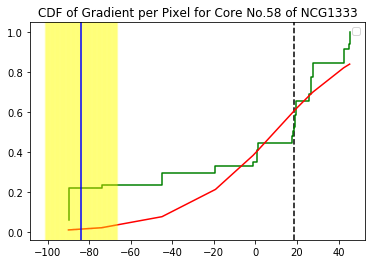

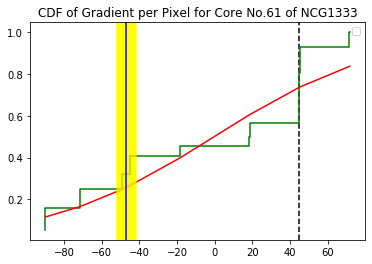

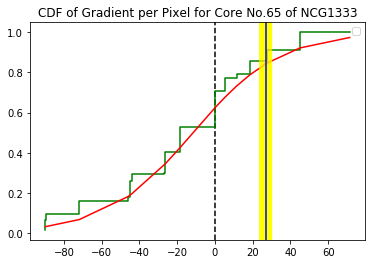

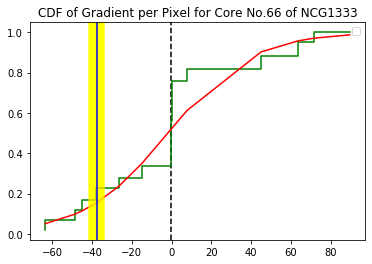

In [87]:
for k in new_index1:
    mu,sigma=Monte_Carlo(k,d1,data1,error1,w1)
    gradient_per_pixel(k,index1,d1,data1,w1,'NCG1333',new_orientation(orientation1))
    s = np.linspace(mu-sigma,mu+sigma,1000)
    for i in s:
        plt.axvline(x=i,color='yellow',alpha=0.03)
    plt.axvline(x=mu,color='b')
    print(k)